##  Unsupervised Learning Series

#  Part 1: Spanning sets and projections

The fundamental principles of unsupervised learning all lie in some very rudimentary ideas from linear algebra combined with the cost-function based approach to learning we have seen previously with supervised methods.  This is because unsupervised learning is about effectively representing datasets with no output, i.e., *only input data*.  Our goal with such data is simply to effectively represent it, and this is a task that has roots in the notion of a *spanning set of vectors* from basic linear algebra.

In this Section of notes we review the fundamental concepts from linear algebra surround the notion of a spanning set of vectors.  This includes: linear independence, learning proper weights for a fixed basis set representation, orthogonal bases and representation, and projections.  Reviewing these topics up front will allow us to much more effectively tackle and intuit unsupervised leaning techniques since they can be thought of as a direct extensions.

In [3]:
# This code cell will not be shown in the HTML version of this notebook
# imports from custom library
import sys
sys.path.append('../../')
import matplotlib.pyplot as plt
import numpy as np

# custom libs
from mlrefined_libraries import unsupervised_library as unsuplib
from mlrefined_libraries import basics_library as baslib
datapath = '../../mlrefined_datasets/unsuperlearn_datasets/'

# this is needed to compensate for matplotlib notebook's tendancy to blow up images when plotted inline
%matplotlib notebook
from matplotlib import rcParams
rcParams['figure.autolayout'] = True

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# 1.  Fixed spanning sets / bases

Unsupervised learning methods origins lie in the notion of a *spanning set of vectors or points* from basic linear algebra.   A number of adjacent concepts are important as well which we also review here, including orthogonality, subspaces, and projections. 

## 1.1  Perfectly representing data via a fixed spanning set

Remember when thinking about points in a (high) dimensional *vector space*, we can think of data points simultaneously as 'dots' (as in the left panel below) or as 'arrows' (as shown in the middle panel).  When thinking about *spanning sets of vectors* it is often helpful to visualize points in the same space using both of these conventions - i.e., some as 'dots' and others as 'arrows' as shown in the right panel.  Those vectors drawn as arrows are particular points - often called a *basis* or *spanning set of vectors* - over which we aim to effeciently represent every other point in the space.  Those other vectors shown as dots are those points we wish to represent over our basis / spanning set.

<figure>
  <img src= '../../mlrefined_images/unsupervised_images/points_and_arrows.jpg
 ' width="100%"  height="auto" alt=""/>
  <figcaption>   
<strong>Figure 1:</strong> <em> **RE-MAKE IMAGE** LEFT PANEL - vectors as points MIDDLE PANEL - vectors as arrows RIGHT PANEL - some vectors shown as dots, others as arrows.  Those shown as arrows are a *basis or spanning set* over which we aim to represent the other vectors [Current image taken from this article](https://brilliant.org/wiki/principal-component-analysis/) </em>  </figcaption> 
</figure>

Lets suppose our set of input points - our *dataset* - is written as  $\mathbf{x}_1,\,\mathbf{x}_2,\,...,\mathbf{x}_P$ and lives in $N$ dimensions (that is, each point is $N$ dimensional).  Moreover throughout we will assume that our dataset has been *mean-centered* - a simple and completely reversible operation that involves subtracting off the mean of the dataset along each input dimension - so that it straddles the origin.  This sort of normalization is almost always done in practice, and is computationally inexpensive to execute. 

In order for our basis / spanning set to be capable of perfectly representing all $P$ of our points it too must live in the same $N$ dimensional space.  For a candidate basis / spanning set $\mathbf{c}_1,\,\mathbf{c}_2,...,\mathbf{c}_N$ to be capable of perfectly representing such generic $N$ dimensional (input) data means that for each data point a set of weights exists so that, in particular linear combination, our basis set can match each datapoint as

\begin{equation}
\sum_{n=1}^N \mathbf{c}_n w_{p,n} = \mathbf{x}_p  \,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\, p=1...P.
\end{equation}


Technically speaking in order for this possibility to exist our spanning set must be *linearly independent* - that is, the spanning vectors do not 'overlap', they point in completely different directions in the space.

As the simplest example imagine our spanning set was the set of $N$ *standard basis vectors*.  The $n^{th}$ element of a standard basis takes the form of vectors that consist entirely of zeros, except for a $1$ in its $n^{th}$ slot

\begin{equation}
\text{($n^{th}$ element of the standard basis)}\,\,\,\,\,\,\,\, \mathbf{c}_n = 
\begin{bmatrix}
0 \\ 
0 \\
\vdots \\
0 \\
1 \\
0 \\
\vdots \\
0
\end{bmatrix}.
\end{equation}

To represent a data point $\mathbf{x}_p$ over the standard basis is a trivial affair, and one can easily check that the perfect weights must be defined as

\begin{equation}
w_{p,n} = x_{p,n}
\end{equation}

i.e., each weight is simply equal to the value of the data point we aim to represent.  For most any other spanning set however these weights must be solved for numerically, which we frame in terms of a cost function minimization after the examples below.

However note that if indeed the spanning set of vectors is linearly independent, then having properly tuned the weights of point $\mathbf{x}_p$, denoted as the $N$ length vector

\begin{equation}
 \mathbf{w}_p = \begin{bmatrix}  w_{p,1} \\ w_{p,2} \\ \vdots \\ w_{p,N} \end{bmatrix}
 \end{equation}

then this weight set provides the new representation of $\mathbf{x}_p$ with respect to the spanning set.  For example, in the trivial case where our spanning set consists of the standard basis our representation or feature vector $\mathbf{w}_p = \mathbf{x}_p$ is the datapoint itself!  Otherwise $\mathbf{w}_p$ - typically referred to as the new *feature representation of $\mathbf{x}_p$* in the *transformed feature space* whose coordinate axes are defined by the spanning set - is a vector that differs from original datapoint. 

> Once tuned the weight vector $\mathbf{w}_p$ provides us with the representation or *feature vector* of $\mathbf{x}_p$ over the spanning set $\mathbf{c}_1,...,\mathbf{c}_N$.  In other words, the weight vector $\mathbf{w}_p$ is our representation of $\mathbf{x}_p$ in the space defined by the spanning set.

**INSERT IMAGE ILLUSTRATING CONCEPT OF FEATURE SPACE REPRESENTATION: Left panel: original space, 2-d, with two spanning vectors and a point or two.  Right panel: representation of points in feature space, fully annotated.**

#### <span style="color:#a50e3e;">Example 1. </span>  Perfect representation with complete spanning set in $N=2$ dimensions

Lets examine an example of a spanning set of vectors in $N=2$ dimensions.  Below we run an animation showing how the set of two spanning vectors

\begin{equation}
\mathbf{c}_1 = 
\begin{bmatrix}
2 \\ 
1
\end{bmatrix}  
\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,
\mathbf{c}_2 = 
\begin{bmatrix}
1\\
2
\end{bmatrix}.
\end{equation}

Because these two vectors are *linearly independent*, that is they do not overlap completely and point in different directions in the space, we can perfectly represent any point in the space using some linear combination of them as 

\begin{equation}
w_{p,1}\mathbf{c}_1 + w_{p,2}\mathbf{c}_2 = \mathbf{x}_p
\end{equation}

where the weights $w_{1,\,p}$ and $w_{2,\,p}$ are unique to each point $\mathbf{x}_p$.  Once properly tuned the weight vector $\mathbf{w}_p = \begin{bmatrix} w_{1,\,p} \\ w_{2,\,p} \end{bmatrix} $ provides us with a new representation of $\mathbf{x}_p$ in the transformed feature space whose coordinates are precisely our spanning set.

In the animation below we range show two panels - the original space in the left, and the transformed feature spce in the right defined by the above spanning set.  In each panel the two spanning set vectors $\mathbf{c}_1$ and $\mathbf{c}_2$ are shown as solid black arrows, and points $\mathbf{x}_p$ (taken over a course range of the input space here) are shown as black dots.  Each point is shown simultaneously in the original and transformed feature space, where the point is represented by its weight vector.  In each space the appropriate linear combination of the two spanning vectors required to represent the point is shown as a red arrow, and each scaled spanning vector is shown as a blue arrow. As the slider is pushed from left to right additional points additional points are shown represented over the spanning set / in the transformed feature space.


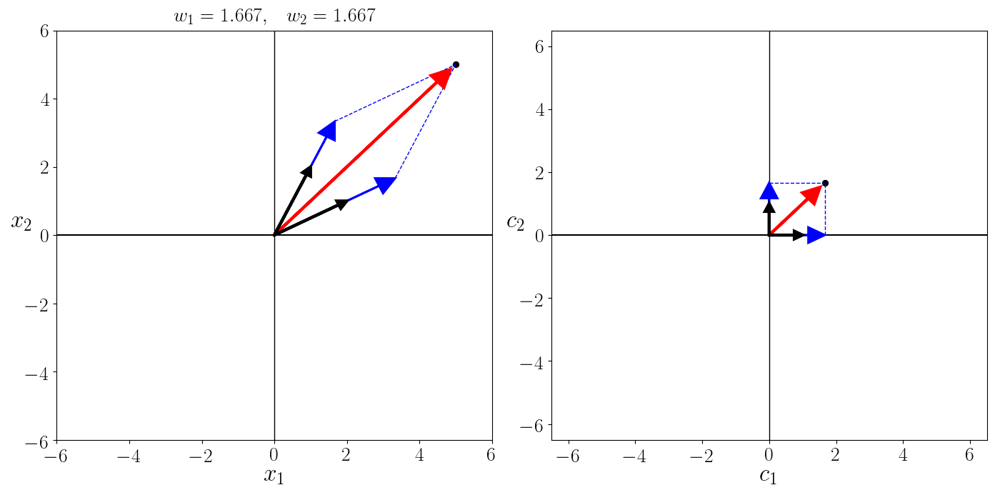
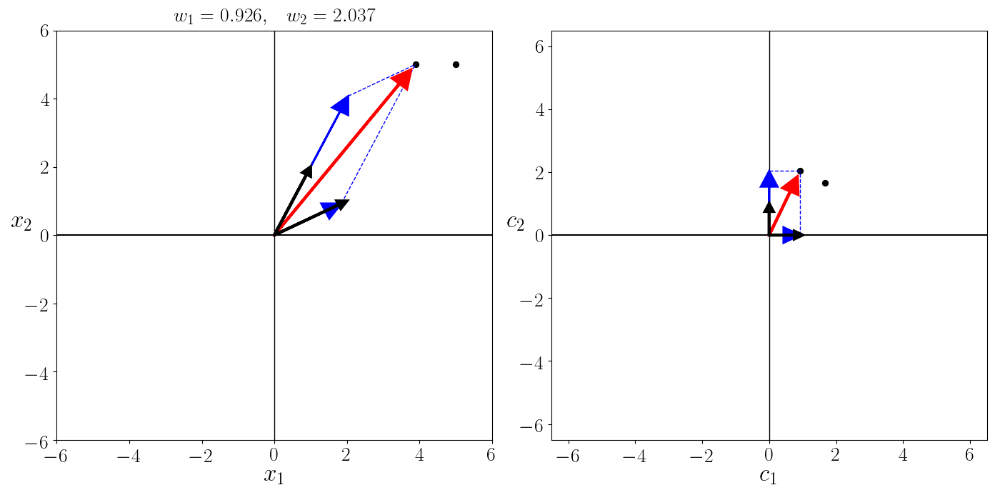
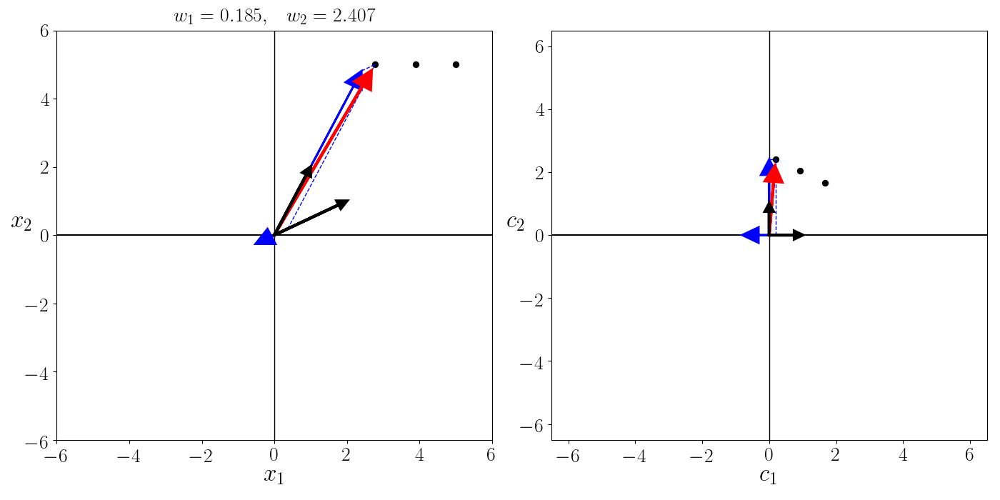
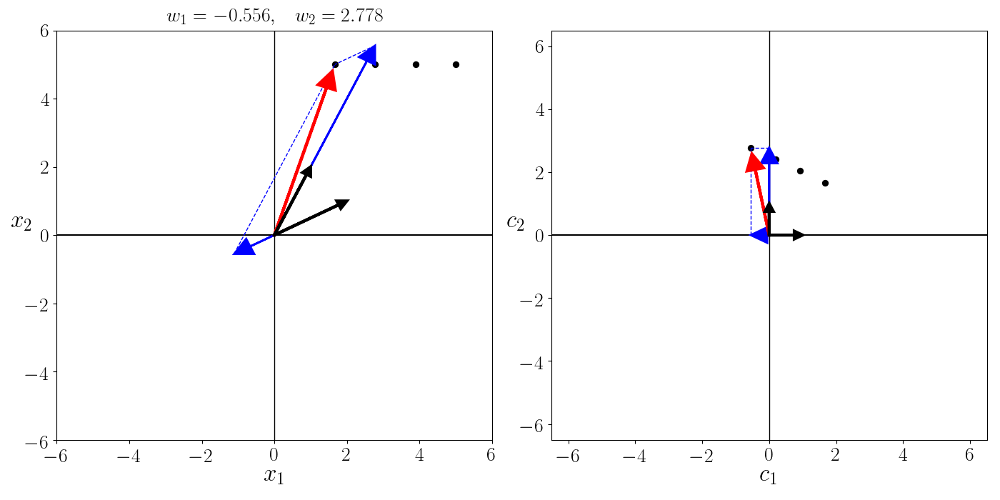
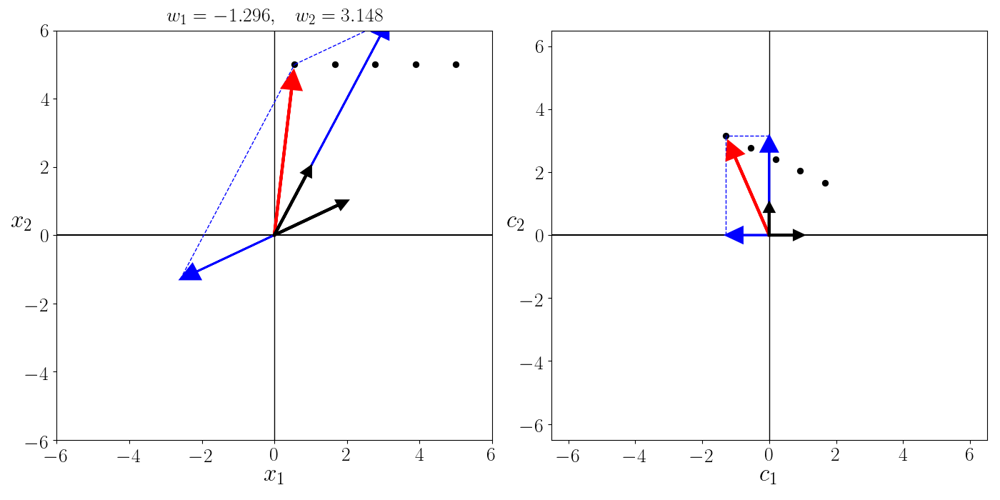
...
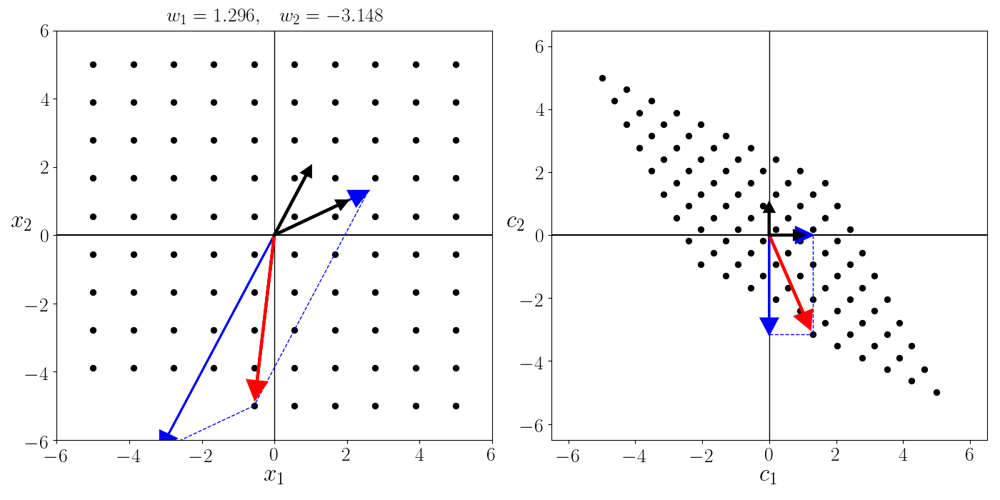
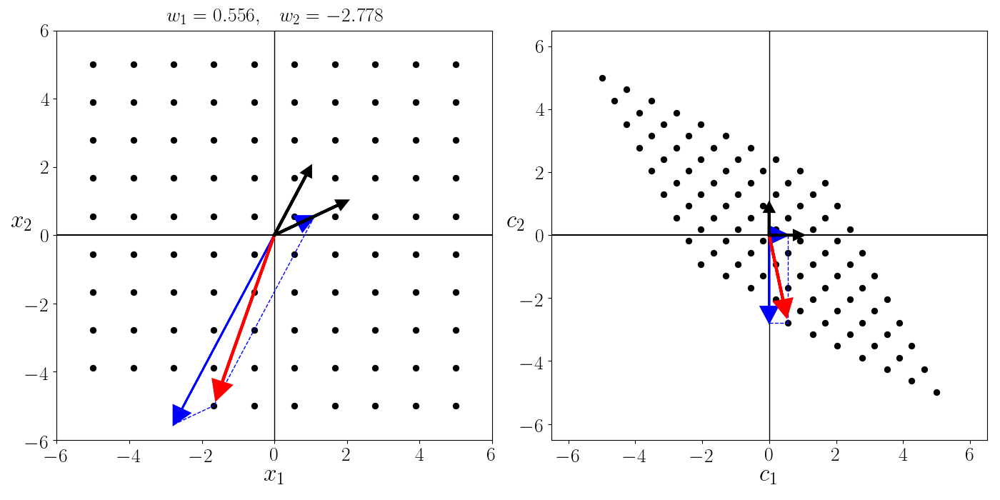
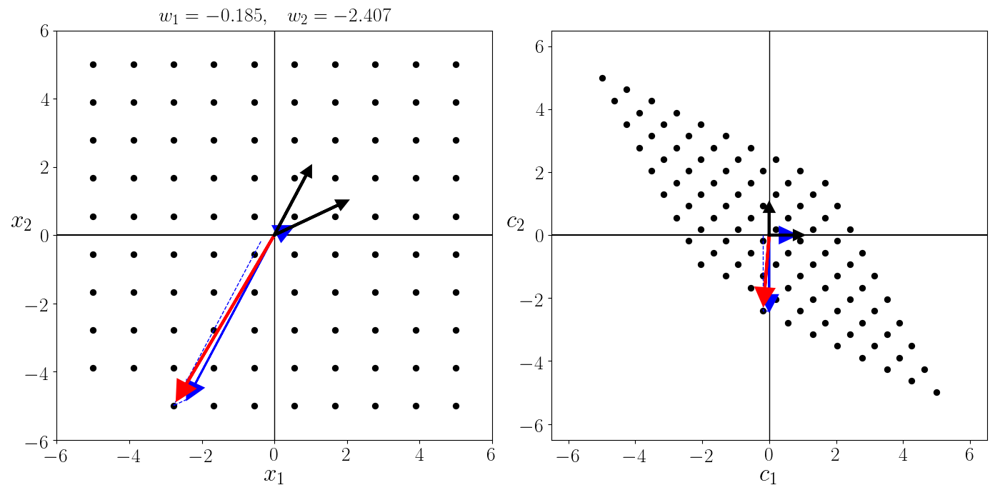
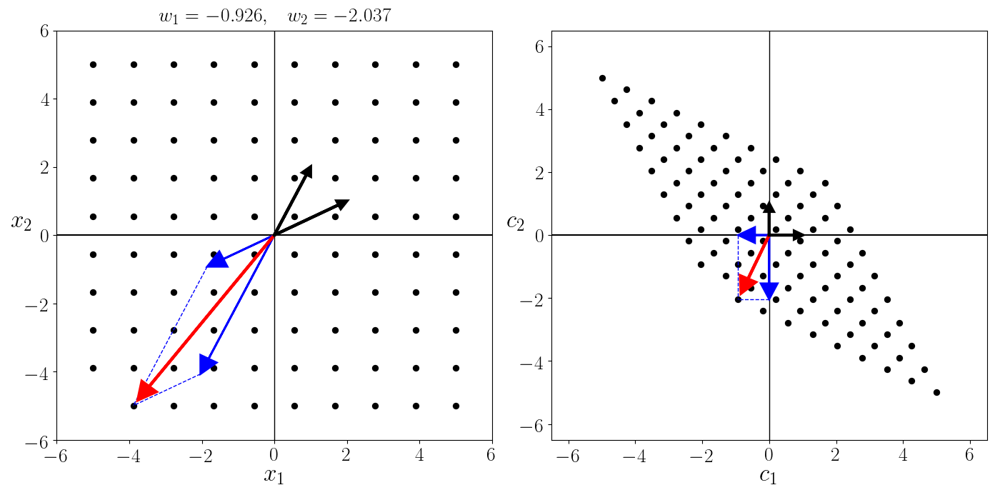
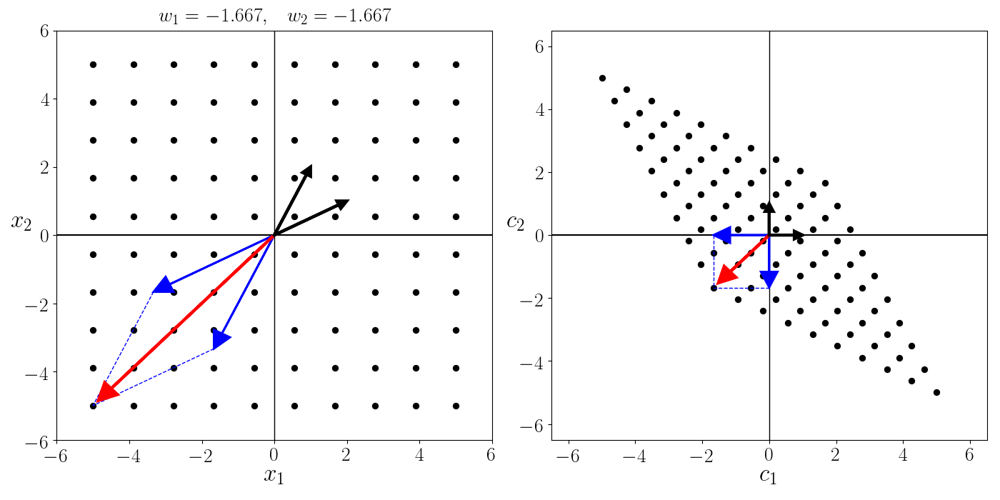

In [8]:
# animate a two-dimensional spanning set ranging over a coarse set of points in the space
vec1 = [2,1]
vec2 = [1,2]
unsuplib.span_animation.perfect_visualize_transform(vec1=vec1,vec2=vec2,num_frames = 200)

In the next cell we show how this spanning set transforms a prototypical dataset of 50 data points.  We will return to this dataset later in examining Principal Component Analysis and the concept of *sphereing* below.

In [102]:
def center(X):
    '''
    A function for normalizing each feaure dimension of an input array, mean-centering
    and division by its standard deviation
    
    '''
    X_means = np.mean(X,axis=1)[:,np.newaxis]
    X_normalized = X - X_means

    return X_normalized

<IPython.core.display.Javascript object>


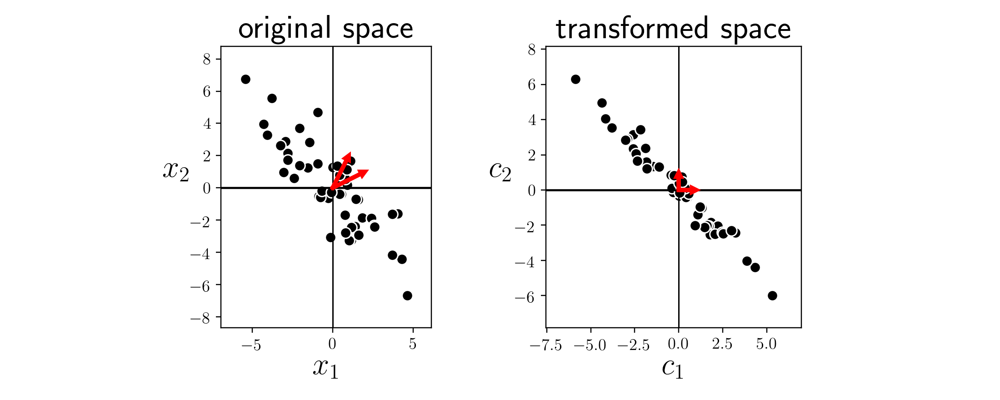

In [103]:
# load in dataset to perform PCA on
X_original = np.loadtxt(datapath + '2d_span_data.csv',delimiter=',')

# center data
X = center(X_original)

# plot data and spanning set, and tranformed version
vec1 = [2,1]
vec2 = [1,2]
unsuplib.span_animation.perfect_visualize_transform_static(vec1=vec1,vec2=vec2,pts = X)

-------

One way we can solve for the proper weights - so as to represent the data over our spanning set - is by setting up / minimizing an appropriate cost function.  Here - since equation (1) is what we desire to hold for the ideal weights - it is natural (as in our development of e.g., linear regression) to square the difference between both sides of equation (1) as $\left(\sum_{n=1}^N \mathbf{c}_n w_{p,n} - \mathbf{x}_p\right)^2$ and tune the corresponding weights to make this squared error as small as possible.  So for each datapoint $\mathbf{x}_p$ we have a cost function 

\begin{equation}
g\left(w_{p,1},...,w_{p,N}\right) = \left(\sum_{n=1}^N \mathbf{c}_n w_{p,n} - \mathbf{x}_p\right)^2  \,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\, p=1...P
\end{equation}

that when minimized appropriately provides us with a proper set of parameters for representing $\mathbf{x}_p$ over the spanning set.   While we could certainly use an iterative method like gradient descent to minimize this single-point cost, here we can in fact directly setup and solve the [first order system](https://jermwatt.github.io/mlrefined/blog_posts/Computational_Calculus/Part_13_unconstrained_optimality_conditions.html) of equations.

It is perhaps easiest to see this by writing the above cost function more compactly as

\begin{equation}
h\left(\mathbf{w}_p\right) = \left \Vert \mathbf{C}\mathbf{w}_p - \mathbf{x}_p \right\Vert_2^2.
\end{equation}

where the $N\times N$ matrix $\mathbf{C}$ is formed by stacking the spanning set vectors column-wise, and the $N\times 1$ vectors $\mathbf{w}_p$ as 

\begin{equation}
\mathbf{C} = 
\begin{bmatrix}
\vert \,\,\,\,\, \vert \,\,\, \cdots  \, \vert \\
\mathbf{c}_1 \,\,\, \mathbf{c}_2 \,\,\,\,\,\, \mathbf{c}_N \\
\vert \,\,\,\,\, \vert \,\,\, \cdots  \, \vert 
\end{bmatrix}
\,\,\,\,\,\,\,\,\,\,\, 
\mathbf{w}_p = 
\begin{bmatrix}
 w_{p,1} \\
 w_{p,2} \\
 \vdots  \\
 w_{p,N}
\end{bmatrix}
\end{equation}

Now setting the gradient of the cost function to zero and solving for $\mathbf{w}_p$ gives the linear symmetric system of equations for each $\mathbf{w}_p$, which we can conveniently write algebraically as 

\begin{equation}
\mathbf{C}^T\mathbf{C}^{\,}\mathbf{w}_p = \mathbf{C}^T\mathbf{x}_p \,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\, p=1...P.
\end{equation}

Numerically this sort of symmetric system of equations can be solved via e.g., coordinate descent.  Once these are solved for - and we have our learned weights $\hat{\mathbf{w}}_p$ -  we can then perfectly represent a point $\mathbf{x}_p$ over the spanning set as we desired in equation (1) as 

\begin{equation}
\mathbf{C}\hat{\mathbf{w}}_p  = \sum_{n=1}^N \mathbf{c}_n \hat{w}_{p,n} = \mathbf{x}_p.
\end{equation}

Notice here that we can take the average of the individual single-point cost functions in equation (4) / (5), giving a cost function over the entire dataset

\begin{equation}
g\left(\mathbf{w}_1,...,\mathbf{w}_P\right) = \frac{1}{P}\sum_{p = 1}^P \left \Vert \mathbf{C}\mathbf{w}_p - \mathbf{x}_p \right\Vert_2^2.
\end{equation}

This is just a convenient way of writing out the entire list of $P$ single-point cost functions together i.e., we get no new solution methods by doing this, as the joint cost decomposes over the weight vectors $\mathbf{w}_p$.  Formally then our optimization problem to recover all of the proper weight vectors can be expressed as

\begin{equation}
\underset{\mathbf{w}_1,\mathbf{w}_2,...,\mathbf{w}_P}{\text{minimize}} \,\, \frac{1}{P}\sum_{p = 1}^P \left \Vert \mathbf{C}\mathbf{w}_p - \mathbf{x}_p \right\Vert_2^2.
\end{equation}

## 1.2  Perfect representation using a fixed orthonormal spanning set

A very special kind of basis / spanning set one often sees when representing datapoints - a form of which we will see later with our primordial unsupervised learning method *Principal Component Analysis* in particular -  is one whose elements are *perpendicular* and *unit length*.  Such a spanning set $\mathbf{c}_1,\,\mathbf{c}_2,\,...\,\mathbf{c}_N$ is one that spans an entire space, but whose elements are perpendicular have length one.  Algebraically this is written as 

\begin{array}
\
\mathbf{c}_n^T\mathbf{c}_m^{\,} = 0 \\
\left \Vert \mathbf{c}_n \right \Vert_2^2 = 1 \,\,\,\,\text{for}\,\,n=1...N.
\end{array}

Note that the same constraints expressed in terms of the concatenated basis matrix $\mathbf{C}$ can be written compactly as 

\begin{equation}
\mathbf{C}^T\mathbf{C}^{\,} = \mathbf{I}_{N\times N}.
\end{equation}

Often such a spanning sets are likewise referred to as *orthonormal* or - sometimes - *orthogonal* (although technically speaking the latter term should only be applied when a set of vectors consists of perpendicular elements that are not necessarily unit-length, it is unfortunately often used to refer to unit-length perpendicular vectors as well).  

#### <span style="color:#a50e3e;">Example 2. </span>  Standard basis

The *standard basis* discussed above the most common example of an *orthogonal* basis - one whose elements are perpendicular and are unit-length.  In the next cell we show a fine range of linear combinations of the standard basis in $N=2$ dimensions.  As with any spanning set / basis, linear combinations of these two vectors can perfectly represent any point in the space.


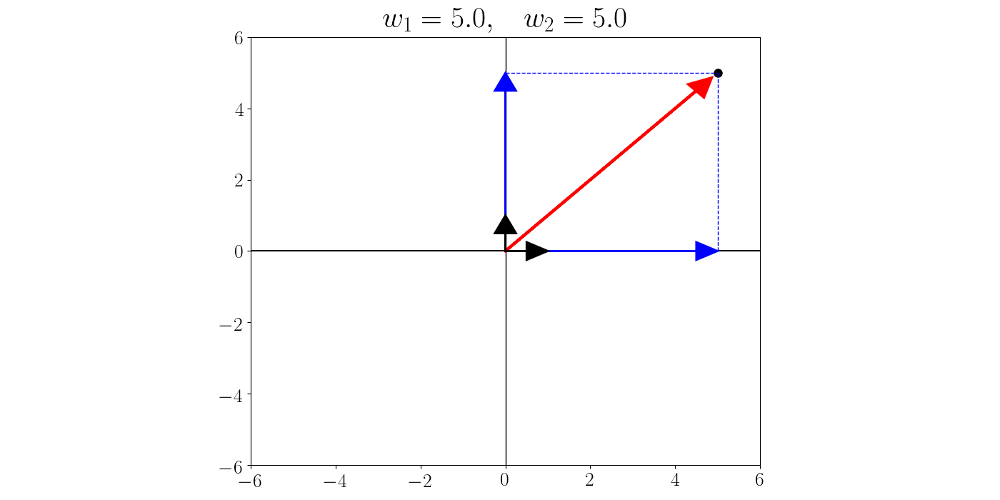
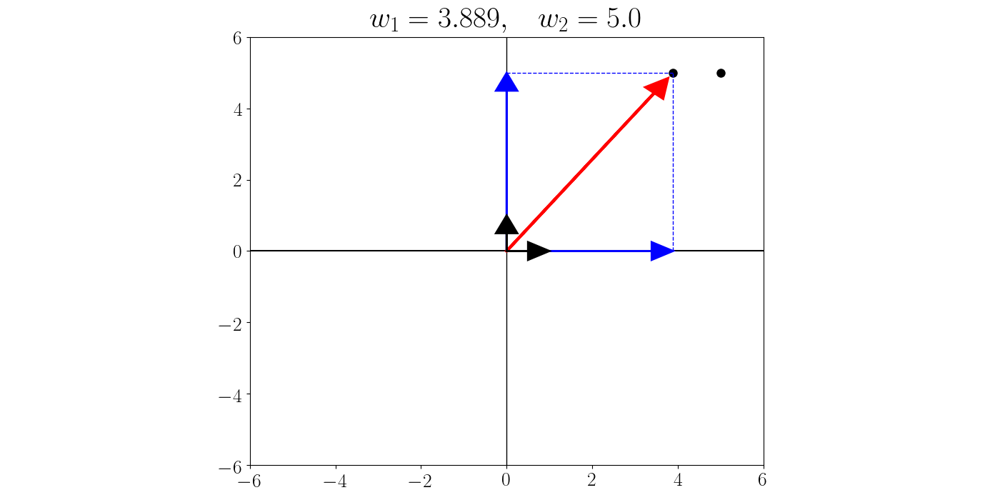
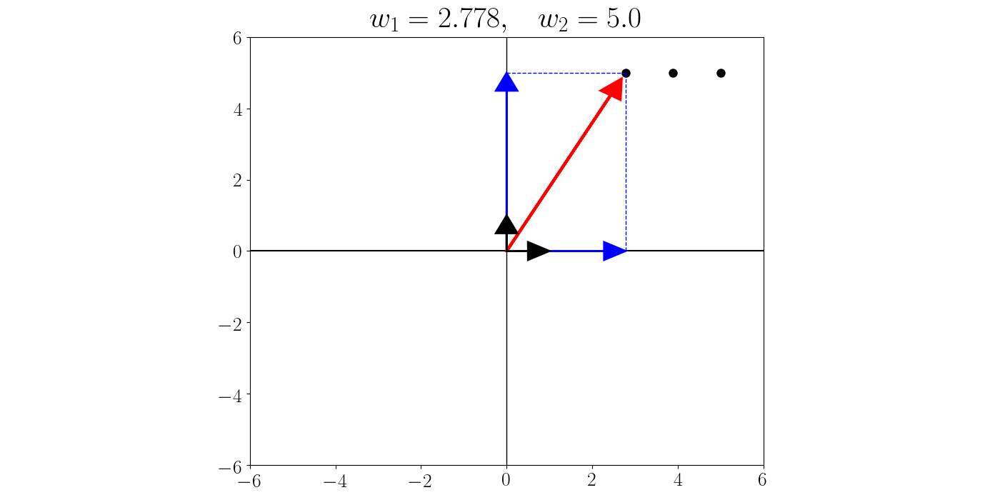
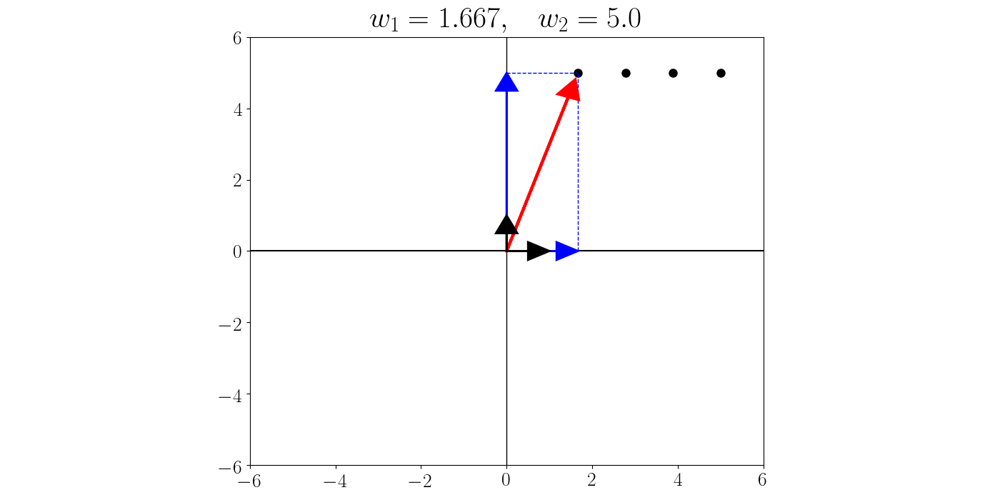
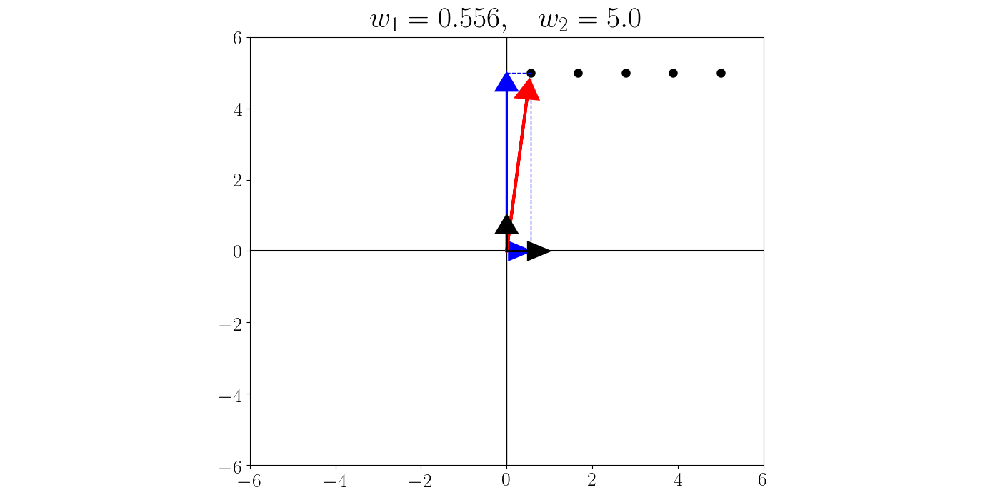
...
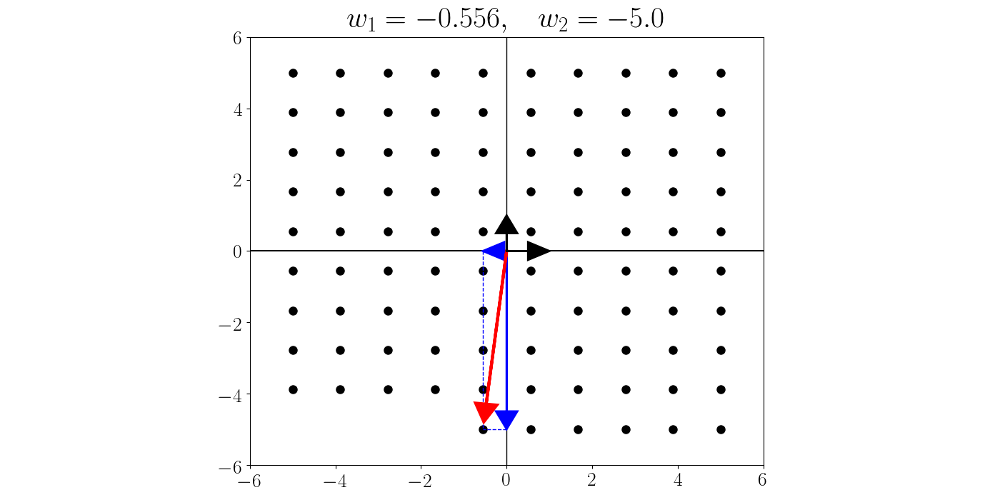
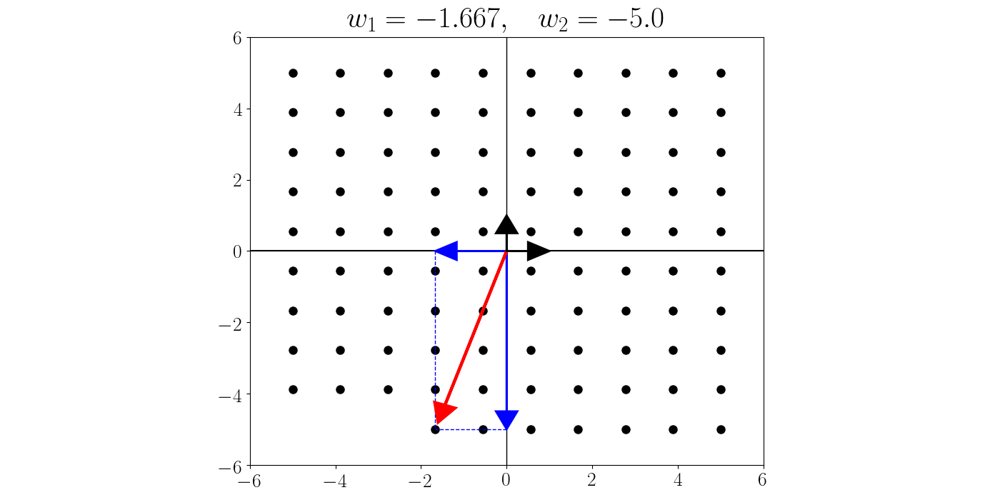
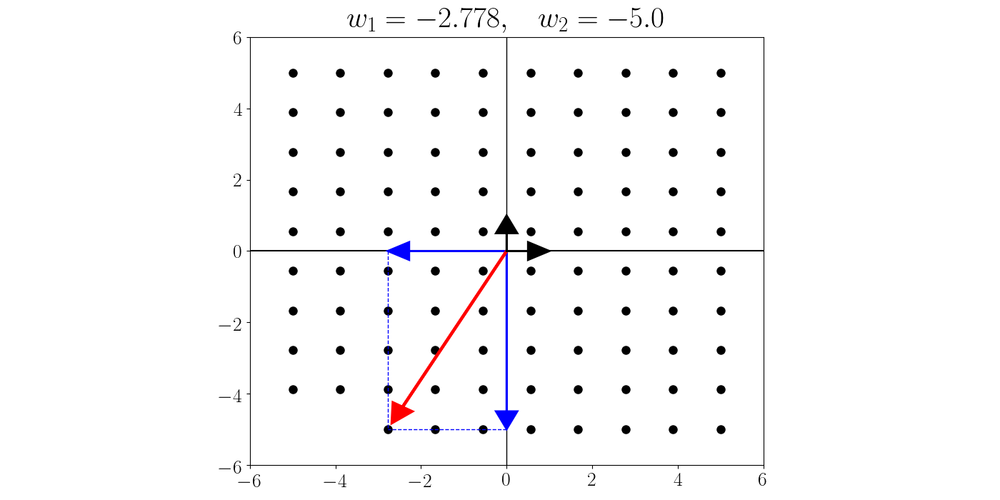
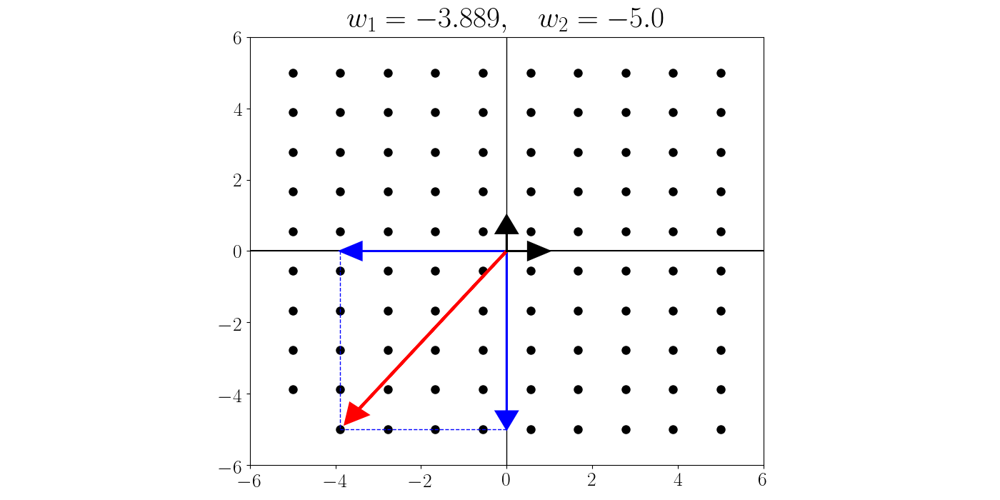
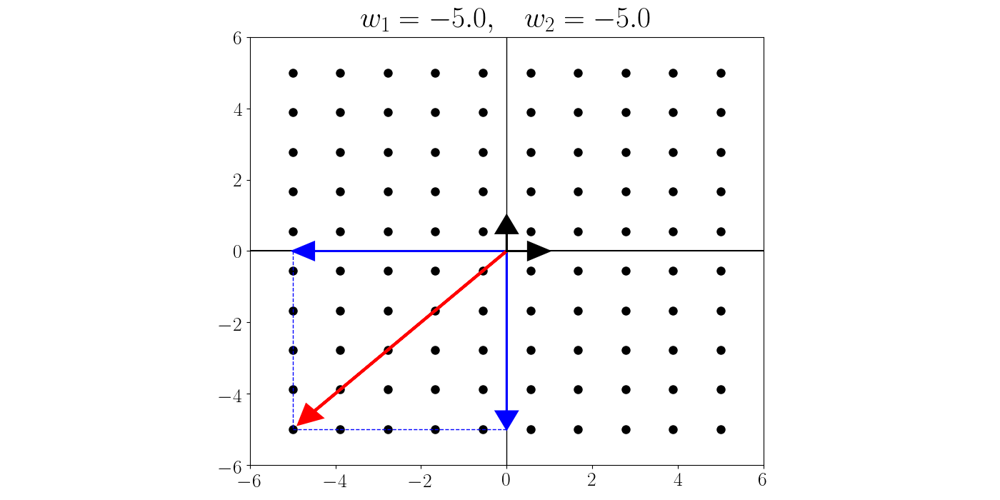

In [40]:
# animate a two-dimensional spanning set ranging over a coarse set of points in the space
vec1 = [1,0]
vec2 = [0,1]
linlib.span_animation.perfect_visualize(vec1=vec1,vec2=vec2,num_frames = 200)

---

As with any other basis / spanning set we can express the particular weights over which a dataset of $P$ points is represented over an orthonormal basis using equations (4) - (8).  However, note that because the elements of an orthonormal basis are perpendicular and unit length the form of the symmetric linear system in equation (4) simplifies drastically.   Again notice how the matrix multiplication on the left hand side -  an inner product of our spanning set vectors against themselves - reduces to the identity matrix $\mathbf{C}^T\mathbf{C} = \mathbf{I}_{N\times N}$.  Thus the "system of equations" in equation (4), providing the ideal weights for representing a set of datapoints, over an orthonormal basis of vectors is given simply by 

\begin{equation}
\mathbf{w}_p = \mathbf{C}^T\mathbf{x}_p      \,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\, p = 1...P.
\end{equation} 

In other words, if a basis / spanning set is orthonormal there is no system of equations left to solve for - we get the solution directly as a simple inner product of the spanning set against each datapoint!  Practically speaking this means that computing the weight vector $\mathbf{w}_p$ for a point $\mathbf{x}_p$ is considerably cheaper if our spanning set is orthonormal.

> When our spanning set is orthonormal the algebraic formula for the weight vector $\mathbf{w}_p$ of a point $\mathbf{x}_p$ is exceedingly simple, and is given by $\mathbf{w}_p = \mathbf{C}^T\mathbf{x}_p$.  Practically speaking, this is considerably cheaper computationally speaking than when our spanning set is not orthonormal (when we must solve a linear system to recover the weight vector).

Note further how here how we can - with these ideal weights solved for - express our data representation over an orthonormal spanning set in equation (1) very nicely in vector / matrix notation as

\begin{equation}
\mathbf{C}\,\mathbf{C}^T\mathbf{x}_p = \mathbf{x}_p  \,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\, p = 1...P.
\end{equation}

In other words, when the spanning set is orthonormal the entire representation of a dataset can be expressed strictly in terms of the spanning set and the data itself.

## 1.3  Imperfectly representing data using a fixed spanning set

Above we reviewed two important facts that we require for a spanning set / basis in order for it to be capable of perfectly representing points in a generic $N$ dimensional space:

1.  The set of vectors are *linearly independent*, that is they point in different directions in the space

2.  There are at least $N$ spanning vectors

What happens when we relax the second condition and suppose we more generally have $K\leq N$ spanning vectors / basis elements?  Unsurprisingly we can no longer perfectly represent a generic set of $P$ points in the space.  In $N$ dimensions this set of $K$ vectors can - at best - span a $K$ dimensional subspace.  For example as illustrated in the figure below, if $N=3$ the best any set of $K=2$ spanning vectors can do is span a hyperplane.  A set consisting of a single $K = 1$ spanning vector can only span a line.  In both instances we clearly will not be able to perfectly represent all possible points in a space, since our reach in each case is restricted to a lower dimensional *subspace* of the full space. 

<figure>
  <img src= '../../mlrefined_images/unsupervised_images/Fig_9_5.png' width="50%"  height="auto" alt=""/>
  <figcaption>   
<strong>Figure 1:</strong> <em> UPDATE IMAGE (left panel)  An example of data in $N = 2$ dimensions projected onto a $K=1$ dimensional subspace spanned by a single spanning vector.  (right panel) An example of data projected in $N = 3$ dimensional space projected onto a $K=2$ dimensional subspace spanned by two basis vectors (**ANNOTATE WITH EQUATIONS FOR PROJECTIONS**).. </em>  </figcaption> 
</figure>

While we may not be able to perfectly represent a given point or set of points in the space, we can try our best.  In complete analogy to the full spanning set representation in equation (1), here for a given set of $P$ points we aim to find ideal weights to represent each datapoints as precisely as possible.  Expressing this algebraically then our ideal weights should satisfy

\begin{equation}
\sum_{n=1}^K \mathbf{c}_n w_{p,n} \approx \mathbf{x}_p  \,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\, p=1...P
\end{equation}

where the $\approx$ should hold as tightly as possible.  Notice: the only difference between this desire and the one in equation (1) is that a) we have only $K$ vectors (the sum goes from $n=1$ to $K$, not $N$ as in equation (1)) and b) since we cannot generally hope for perfect equality we must settle for $\approx$.  

Mirroring the setup we saw above with a complete basis, the same logic then leads us to the Least Squares cost function (a generalization of equation (4) above) for each datapoint

\begin{equation}
g\left(w_{p,1},...w_{p,K}\right) = \left(\sum_{n=1}^K \mathbf{c}_n w_{p,n} - \mathbf{x}_p\right)^2   \,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\, p=1...P
\end{equation}

where again here the only difference from the original cost function is that we now only have $K$ spanning set vectors.  Likewise we can derive the similar looking *first order system* of symmetric equations providing our ideal weights, writing them neatly using the compact vector / matrix notation established previously as

\begin{equation}
\mathbf{C}^T\mathbf{C}^{\,}\mathbf{w}_p = \mathbf{C}^T\mathbf{x}_p \,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\, p=1...P.
\end{equation}

Here there is of course only one caveat: since we have only $K$ spanning set vectors the matrix $\mathbf{C}$ is $N\times K$, consisting of only our $K$ spanning vectors lined up column-wise $\mathbf{C} = 
\begin{bmatrix}
\vert \,\,\,\,\, \vert \,\,\, \cdots  \, \vert \\
\mathbf{c}_1 \,\,\, \mathbf{c}_2 \,\,\,\,\,\, \mathbf{c}_K \\
\vert \,\,\,\,\, \vert \,\,\, \cdots  \, \vert
\end{bmatrix}$.

## 1.4  Imperfect representation using a fixed orthonormal spanning set

If our spanning set / basis of $K$ elements is orthonormal the above formula once again reduces algebraically to 

\begin{equation}
\mathbf{w}_p = \mathbf{C}^T\mathbf{x}_p      \,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\, p = 1...P
\end{equation} 

since we will have 

\begin{equation}
\mathbf{C}^T\mathbf{C}^{\,} = \mathbf{I}_{K\times K}.
\end{equation}

Our representation is likewise given simply in terms of the incomplete spanning set and datapoints as

\begin{equation}
\mathbf{C}^{\,}\mathbf{C}^T\mathbf{x}_p \approx \mathbf{x}_p  \,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\, p = 1...P.
\end{equation}

Irregardless as to whether or not an incomplete spanning set of $K$ vectors is indeed orthonormal, once the weights are tuned optimally as $\hat{\mathbf{w}}_p$ the value

\begin{equation}
\mathbf{C}\hat{\mathbf{w}}_p  = \sum_{n=1}^K \mathbf{c}_n \hat{w}_{p,n} \approx \mathbf{x}_p
\end{equation}

is referred to as the *projection of $\mathbf{x}_p$ onto the spanning set*, and tells us where the projected point (dropped onto a $K \leq N$ dimensional subspace) lies in the original space.  This is called the *projection* because - geometrically speaking - the representation above is given by 'dropping' $\mathbf{x}_p$ perpendicularly onto the span of the hyperplane made by the span of the $K$ basis elements.  With respect to just the subspace itself we represent each data point $\mathbf{x}_p$ over the spanning set precisely way we do in the full dimensional case (when $K=N$ exactly) - i.e., via its weight vector $\mathbf{w}_p$.

> Once tuned the weight vector $\mathbf{w}_p$ provides us with the representation of $\mathbf{x}_p$ over the spanning set $\mathbf{c}_1,...,\mathbf{c}_K$.  In other words, the weight vector $\mathbf{w}_p$ is our representation of $\mathbf{x}_p$ in the space defined by the spanning set.

**FIGURE TO MAKE:** (left panel) A data cloud in 3-d, with 2-d fixed subspace and projections with one point labeled in 3-d and its projection labeled $\mathbf{C}\mathbf{w}_p $  (right panel) The same dataset shown with respect to the spanning set in 2-d, with the same point labeled as its weight vector $\mathbf{w}_p $.

#### <span style="color:#a50e3e;">Example 3: </span> Dimension reduction using a fixed basis

Below we show how a prototypical three dimensional dataset is projected onto a two-dimensional subspace generated by two fixed vectors


\begin{equation}
\mathbf{c}_1 = 
\begin{bmatrix}
2 \\ 
1 \\
0
\end{bmatrix}  
\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,
\mathbf{c}_2 = 
\begin{bmatrix}
1\\
2\\
0
\end{bmatrix}.
\end{equation}

In the left panel below the original data is shown, along with the two spanning vectors above shown as red vectors and the hyperplane they span colored light red.  In the right panel we show how the data is represented over the two spanning vectors, in the lower dimensional subspace.  Here each point $\mathbf{x}_p$ is now represented by its corresponding tuned weight vector $\mathbf{w}_p$.

<IPython.core.display.Javascript object>


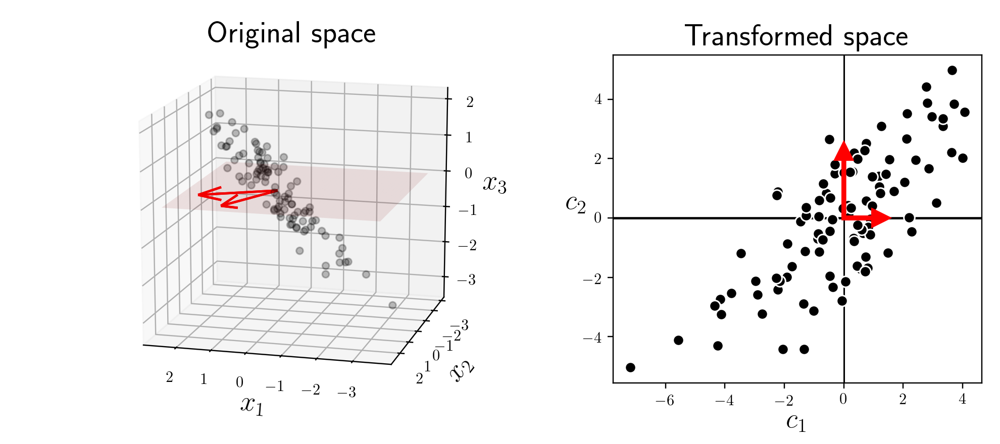

In [104]:
# load in dataset to perform PCA on
X_original = np.loadtxt(datapath + '3d_span_data.csv',delimiter=',')

# center data
X = center(X_original)

# take two random vectors, project onto a subspace spanned by them
C = np.array([[2,1,0],[1,2,0]]).T
X_transformed_3d = np.dot(C.T,X)

# produce visuals
init = [15,105]
unsuplib.PCA_demos.project_data_from_3d_to_2d(X,X_transformed_3d,C,init)

#### <span style="color:#a50e3e;">Example 4: </span> Role of efficient bases in digital image compression 

Every day we use digital image compression to reduce the size of digital images without adversely affecting their quality, so that we can store and transmit them more efficiently.  As we will see in this example digital image compression is a fundamental example of fixed basis dimension reduction.

As shown in the figure below, in a typical image compression scheme for an input image is first cut up into small square (typically $8 \times 8$ pixel blocks).  The values of pixels in each block (which are integers between $0$ and $255$ for an 8-bit grayscale image) are stacked into a column vector $\mathbf{x}$, and compression is then performed on these individual vectorized blocks .   Note: while we discuss image compression here for grayscale images The same idea applies to color images, only there we have three such images to compress - a red, green, and blue color channel image.

<figure>
  <img src= '../../mlrefined_images/unsupervised_images/Fig_9_8.png' width="50%" height="auto" alt=""/>
  <figcaption>   
<strong>Figure 4:</strong> <em> **RE-ANNOTATE** In a prototypical image compression scheme the input image is cut into $8 \times 8$ blocks. Each block is then vectorized to make a $64 \times 1$ column vector $y$ which will be input to the compression algorithm.
  </em>  </figcaption> 
</figure>

The primary idea behind many digital image compression algorithms is that with the use of specific bases, we only need very few of their elements to very closely approximate any natural image. One such basis, the $8 \times 8$ discrete cosine transform (DCT) which is the backbone of the popular JPEG compression scheme, consists of two-dimensional cosine waves of varying frequencies, and is shown in the figure below along with its analogue standard basis.  This basis is orthonormal, thus making computation quite efficient.

<figure>
  <img src= '../../mlrefined_images/unsupervised_images/Fig_9_9.png' width="50%" height="auto" alt=""/>
  <figcaption>   
<strong>Figure 5:</strong> <em>(left) The set of $64$ DCT basis elements used for compression of $8 \times 8$ image blocks. For visualization purposes pixel values in each basis patch are gray-coded so that white and black colors correspond to the minimum and maximum value in that patch, respectively. (right) The set of $64$ standard basis elements, each having only one nonzero entry. Pixel values are gray-coded so that white and black colors correspond to entry values of $1$ and $0$, respectively. Most natural image blocks can be approximated as a linear combination of just a few DCT basis elements while the same cannot be said of the standard basis.
 </em>  </figcaption> 
</figure>

Most natural image blocks can be well approximated using only a few elements of the DCT basis. The reason is, as opposed to bases with more locally defined elements (e.g., the standard basis), each DCT basis element represents a fluctuation commonly seen across the entirety of a natural image block. Therefore with just a few of these elements, properly weighted, we can approximate a wide range of image blocks. In other words, instead of seeking out a basis (as with PCA), here we have a fixed basis over which image data can be very efficiently represented.

To perform compression, the DCT basis / spanning set patches shown in the figure above are vectorized into a sequence of $N=64$ fixed basis vectors $\left\{ \mathbf{c}_{n}\right\} _{n=1}^{N}$ in the same manner as the input image blocks. Concatenating these patches column-wise into a matrix $\mathbf{C}$ and supposing there are $P$ blocks in the input image, denoting by $\mathbf{x}_{p}$ its $p^{th}$ vectorized block, to represent the entire image over the basis we solve $P$ linear systems of equations of the form

\begin{equation}
\mathbf{C}\mathbf{w}_{p}=\mathbf{x}_{p} \,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\, p = 1...P
\end{equation}

Each vector $\mathbf{w}_{p}$ in equation (9) stores the DCT coefficients (or weights) corresponding to the image block $\mathbf{x}_{p}$. Most of the weights in the coefficient vectors $\left\{ \mathbf{w}_{p}\right\} _{p=1}^{P}$ are typically quite small. Therefore, as illustrated by an example image in Figure 6 below, setting even $80\%$ of the smallest weights to zero gives an approximation that is essentially indistinguishable from the original image. Even setting $99\%$ of the smallest weights to zero gives an approximation to the original data wherein we can still identify the objects in the original image. To compress the image, instead of storing each pixel value, only these few remaining nonzero coefficients are kept. 

<figure>
  <img src= '../../mlrefined_images/unsupervised_images/Fig_9_10.png' width="90%" height="auto" alt=""/>
  <figcaption>   
<strong>Figure 6:</strong> <em> From left to right, the original $256 \times 256$ input image along with its three compressed versions where we keep only the largest $20\%$, $5\%$, and $1\%$ of the DCT coefficients to represent the image, resulting in compression by a factor of $5$, $20$, and $100$, respectively. Although, as expected, the visual quality deteriorates as the compression factor increases, the $1\%$ image still captures a considerable amount of information. This example is a testament to the efficiency of DCT basis in representing natural image data.
 </em>  </figcaption> 
</figure>

# 2.  Learning a proper subspace: Principal Component Analysis

The most fundamental *unsupervised learning* method - known as *Principal Component Analysis* (or *PCA* for short) follows directly from our previous discussion of fixed basis representations with one crucial caveat: now we aim to learn not only the best linear combination of a set of $K \leq N$ spanning vectors to represent $N$ dimensional points as best as possible, but the best set of spanning vectors themselves as well.

## 2.1  Perfectly representing data via a learned spanning set

Imagine we go back to the start in Section 1.1 where we first started discussed how - given a fixed basis or spanning set of $N$ vectors $\mathbf{c}_1,\,\mathbf{c}_2,...,\mathbf{c}_N$ - to represent a set of $P$ mean-centered points $\mathbf{x}_1,\,\mathbf{x}_2,...,\mathbf{x}_P$ exactly as

\begin{equation}
\sum_{n=1}^N \mathbf{c}_n w_{p,n} = \mathbf{x}_p  \,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\, p=1...P
\end{equation}

where the weights $w_{p,n}$ we saw can be learned by minimizing a Least Squares cost function.  Before we supposed the spanning set / basis was fixed - here we will *learn* it along with the ideal weights.  This slight twist on the theme of fixed basis representation is called *Principal Component Analysis*, for reasons we discuss below.

In order to make this adjustment all we first need to do is minimize the Least Squares cost function we saw in equation (12) over the set of basis elements $\mathbf{c}_1,\,\mathbf{c}_2,\,...,,\mathbf{c}_N$.  Here we will use the same matrix notation $\mathbf{C}$ to compactly represent these $N$ basis elements.  Adding this to the list of optimization variables we need to minimize with respect to, this cost function (mirroring equation (12)) is 

\begin{equation}
g\left(\mathbf{w}_1,...,\mathbf{w}_P,\mathbf{C}\right) = \frac{1}{P}\sum_{p = 1}^P \left \Vert \mathbf{C}\mathbf{w}_p - \mathbf{x}_p \right\Vert_2^2.
\end{equation}

Again - the only thing that has changed here is that now (since we aim to learn the basis $\mathbf{C}$ as well) the basis $\mathbf{C}$ has been added to the list of variables we wish to minimize this cost function with respect to.  

Likewise - mirroring equation (13) - the formal problem of minimizing this Least Squares cost mirrors the minimization can now be written as

\begin{equation}
\underset{\mathbf{w}_1,\mathbf{w}_2,...,\mathbf{w}_P,\mathbf{C}}{\text{minimize}} \,\, \frac{1}{P}\sum_{p = 1}^P \left \Vert \mathbf{C}\mathbf{w}_p - \mathbf{x}_p \right\Vert_2^2.
\end{equation}

This cost function can be properly minimized using any number of approaches, but given the block-variable structure of the inputs a block-coordinate descent method seems to be the natural choice of algorithm.  What does this involve?  

First keeping the basis fixed (at say some initial value) we sweep through and update each weight vector $\mathbf{w}_p$ as we did in Section 1.1 i.e., the sequence of updates given by solving the $P$ linear systems

\begin{equation}
\mathbf{C}^T\mathbf{C}^{\,}\mathbf{w}_p = \mathbf{C}^T\mathbf{x}_p \,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\, p=1...P .
\end{equation}

Each of these updates minimizes the above with respect to a weight vector.  Then, keeping all of the weight vectors fixed, we can update $\mathbf{C}$ by setting up / solving the first order system with respect to it (this can indeed be done).  One can check that the first order system of our Least Squares cost function above with respect to the matrix $\mathbf{C}$ is given by

\begin{equation}
\left(\sum_{p=1}^P\mathbf{w}_p^{\,}\mathbf{w}_p^T \right) \mathbf{C} = \sum_{p=1}^P \mathbf{x}_p^{\,}\mathbf{w}_p^T \,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,
\end{equation}

which is a linear system in the matrix $\mathbf{C}$.

Repeating this procedure a small number of times will produce convergence to an ideal basis / set of weight vectors for the dataset.  This algorithmic idea - which is a simple extension of the *coordinate descent* to blocks of variables - is often referred to a *block-wise coordinate descent*.  

Note that while we are learning a proper basis here issues relating to representation do not change from the instance of a fixed basis e.g., our representation or feature vector for the point $\mathbf{x}_p$ over the spanning set is given precisely by its weight vector $\mathbf{w}_p$.

> Issues relating to representation remain unchanged from the instance of a fixed basis e.g., our representation or feature vector for the point $\mathbf{x}_p$ over the spanning set is given precisely by its weight vector $\mathbf{w}_p$.

## 2.2  Perfect representation using a learned orthonormal spanning set

In Section 1.1 we also saw that when a basis is *orthonormal* - i.e., that $\mathbf{C}^T\mathbf{C}^{\,} = \mathbf{I}_{N\times N}$ - that the update formula for the weight vectors collapses from a linear system we must solve to a simple inner product calculation.  In our current context - where we aim to learn a proper basis - the *restriction* to such bases likewise drastically reduces the complexity of the above calculations - for both the weight vectors *and* the optimal basis. While unravelling the simple formulae driven by the consequences of the orthonormal assumption takes some effort, the end result is well worth the effort.  Moreover - due to its simplicity and statistical interpretation - the recovered orthonormal basis we describe here is by far the most commonly used form of Principal Component Analysis used in practice.

To begin, note that we can restrict ourselves to only orthonormal bases by constraining the Least Squares cost function in equation (27) so that 
$\mathbf{C}^T\mathbf{C}^{\,} = \mathbf{I}_{N\times N}$, and we can express this adjustment formally by adding the constraint to equation (28) as 

\begin{equation}
\begin{aligned}
\underset{\mathbf{w}_1,\mathbf{w}_2,...,\mathbf{w}_P,\mathbf{C}}{\,\,\,\,\,\mbox{minimize}\,\,\,} & \,\,\,\, \frac{1}{P}\sum_{p = 1}^P \left \Vert \mathbf{C}\mathbf{w}_p - \mathbf{x}_p \right\Vert_2^2    \\
\mbox{subject to}\,\,\, & \,\,\,\,\,  \mathbf{C}^T\mathbf{C}^{\,} = \mathbf{I}_{N\times N}. \,\,\,\,\,\, 
\end{aligned}
\end{equation}

As we will see by studying this constrained problem, we can but need not use a formal iterative method (e.g., coordinate descent, gradient descent) to solve the above problem. 

So suppose we enforce the orthonormal constraint - what happens to our cost function?  Immediately we can say - from either equation (29) or its precursor in Section 1.1 equation (15) - that irregardless of the actual value of $\mathbf{C}$ the formula for an ideal set weights for our basis will always be given by the compact / formula

\begin{equation}
\mathbf{w}_p = \mathbf{C}^T\mathbf{x}_p \,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\, p=1...P .
\end{equation}

 

Previous in Section 1 we emphasized the benefit of this update - it is far more computationally efficient than solving linear systems (which we must do when the basis is not orthonormal).  Here since we are  learning $\mathbf{C}$ (as opposed to it being fixed) this benefit is magnified: *the constraint that our basis must be orthonormal makes our weight vectors completely redundant*.  In other words, replacing the weight vectors in our cost function in equation (7) with the updates given above our cost function becomes

\begin{equation}
g\left(\mathbf{C}\right) = \frac{1}{P}\sum_{p = 1}^P \left \Vert \mathbf{C}_{\,}^{\,}\mathbf{C}_{\,}^T\mathbf{x}_p - \mathbf{x}_p \right\Vert_2^2
\end{equation}

which is a function of $\mathbf{C}$ alone.  

Let us briefly examine one summand of this reduced cost function.  Expanding the of the $p^{th}$ summand and using our assumption that $\mathbf{C}^T\mathbf{C}^{\,} = \mathbf{I}_{N\times N}$ we can see that it may be re-written equivalently as

\begin{equation}
\left \Vert \mathbf{C}_{\,}\mathbf{C}^T\mathbf{x}_p - \mathbf{x}_p \right\Vert_2^2  = -\left\Vert \mathbf{C}^T\mathbf{x}_p \right\Vert_2^2 + \left \Vert\mathbf{x}_p\right \Vert_2^2.
\end{equation}

Since our aim is to *minimize* the summation of terms taking the form of the above, and the datapoint $\mathbf{x}_p$ is fixed and does not include the variable $\mathbf{C}$ we are minimizing with respect to, minimizing the original summand on the left is equivalent to minimizing *only the first term* $-\left\Vert \mathbf{C}^T\mathbf{x}_p \right\Vert_2^2$ on the right hand side.  Summing up these terms, the $p^{th}$ of which can be written decomposed over each individual basis element we aim to learn as

\begin{equation}
-\left\Vert \mathbf{C}^T\mathbf{x}_p \right\Vert_2^2 = -\sum_{n=1}^N \left(\mathbf{c}_n^T\mathbf{x}_p^{\,} \right)^2,
\end{equation}

gives us the equivalent cost function to minimize for our ideal orthonormal basis

\begin{equation}
g\left(\mathbf{C}\right) = -\frac{1}{P}\sum_{p=1}^P \sum_{n=1}^K  \left(\mathbf{c}_n^T\mathbf{x}_p^{\,} \right)^2.
\end{equation}

Again note that the cost function no longer is a function of the weight vectors $\mathbf{w}_p$ - our orthogonality assumption removes the need for us to use optimization to recover their optimal values directly (since in this case they are defined entirely in terms of the optimal basis). 

Studying this reduced form of our cost function we can see that it *decomposes completely over the basis vectors $\mathbf{c}_n$*, i.e., there are no terms where $\mathbf{c}_i$ and $\mathbf{c}_j$ interact when $i\neq j$.  This means - practically speaking - that we can optimize our orthonormal basis *one element at a time*.  Reversing the order of the summands above we can isolate each individual basis element over the entire dataset, writing above equivalently as 

\begin{equation}
g\left(\mathbf{C}\right) = -\frac{1}{P}\sum_{n=1}^K \sum_{p=1}^P \left(\mathbf{c}_n^T\mathbf{x}_p^{\,} \right)^2.
\end{equation}

Now we can think about minimizing our cost function one basis element at a time.  Beginning with $\mathbf{c}_1$ we first isolate only those relevant terms above, which consists of: $-\frac{1}{P}\sum_{p=1}^P \left(\mathbf{c}_1^T\mathbf{x}_p^{\,}\right)^2$.    Since there is a minus sign out front of this summation, this is the same as *maximizing* its negation which we denote as

\begin{equation}
h\left(\mathbf{c}_1\right) = \frac{1}{P}\sum_{p=1}^P \left(\mathbf{c}_1^T\mathbf{x}_p^{\,} \right)^2.
\end{equation}

Since our basis is constrained to be orthonormal the basis element $\mathbf{c}_1$ in particular is constrained to have unit-length.  Statistically speaking, the above measures the *sample variance of the dataset in the direction defined by $\mathbf{c}_1$*.  Note: this quantity is precisely the sample variance because our data is assumed to have been *mean-centered*.  Since we aim to maximize this quantity we can phrase our optimization in purely sample statistical terms as well: we aim to recover the a form of the basis vector $\mathbf{c}_1$ that points in the maximum direction of variance in the dataset.  

<figure>
  <img src= '../../mlrefined_images/unsupervised_images/TO_MAKE.png' width="50%" height="auto" alt=""/>
  <figcaption>   
<strong>Figure 4:</strong> <em> TO_DO: Here we illustrate the how the variance of a dataset is measured along a particular direction by the formula $h\left(\mathbf{c}_1\right)$
  </em>  </figcaption> 
</figure>

To determine the maximum value of the function above / determine the direction of maximum sample variance in the data we can rewrite equation (38) above by stacking the data points $\mathbf{x}_p$ column-wise - forming the $N\times P$ matrix $\mathbf{X}$ - giving the equivalent formula in 

\begin{equation}
h\left(\mathbf{c}_1\right) = \frac{1}{P}\mathbf{c}_1^T \mathbf{X}^{\,}_{\,}\mathbf{X}^T_{\,} \mathbf{c}_1^{\,} = \mathbf{c}_1^T\left(\frac{1}{P}\mathbf{X}^{\,}_{\,}\mathbf{X}^T_{\,} \right)\mathbf{c}_1^{\,}.
\end{equation}

Written in this form the above takes the form of a so-called *Rayleigh Quotient* (see [example 9 of our post on optimality conditions](https://jermwatt.github.io/mlrefined/blog_posts/Computational_Calculus/Part_13_unconstrained_optimality_conditions.html)) whose maximum can is expressible algebraically in closed form based on the [eigenvalue / eigenvector decomposition](https://jermwatt.github.io/mlrefined/blog_posts/Computational_Linear_Algebra/Part_2_eigenvalues_and_eigenvectors.html) of the matrix $\mathbf{X}^{\,}\mathbf{X}^T$ (in the middle term) or likewise the matrix $\frac{1}{P}\mathbf{X}^{\,}\mathbf{X}^T$ (in the term on the right).  Because the matrix $\frac{1}{P}\mathbf{X}^{\,}\mathbf{X}^T$ can be interpreted statistically as the *covariance matrix* of the data it is more common to use the particular algebraic arrangement on the right.

So, denoting denoting $\mathbf{v}_1$ and $d_1$ the eigenvector and largest eigenvalue of $\frac{1}{P}\mathbf{X}^{\,}\mathbf{X}^T$ the maximum of the above occurs when $\mathbf{c}_1 = \mathbf{v}_1$, where $h\left(\mathbf{v}_1\right) = d_1$ - which is also the variance in this direction.  Remember: this direction $\mathbf{v}_1$ points in the largest direction of variance in the dataset.  In the jargon of machine learning $\mathbf{v}_1$ is referred to as the *first principal component* of the data, hence the name *Principal Component Analysis*.

With our first basis vector in hand, we can move on to determine the second element of our ideal orthonormal spanning set.  Plucking out the relevant terms from equation (37) and following the same thought process we went through above results in the familiar looking function

\begin{equation}
h\left(\mathbf{c}_2\right) = \frac{1}{P}\sum_{p=1}^P \left(\mathbf{c}_2^T\mathbf{x}_p^{\,} \right)^2
\end{equation}

that we aim to maximize in order to recover our second basis vector.  This formula has the same sort of statistical interpretation as the analogous version of the first basis vector had above - here again it calculates the variance of the data in the direction of $\mathbf{c}_2$.  Since our aim here is to maximize - given that $\mathbf{c}_1$ has already been resolved and that $\mathbf{c}_1^T\mathbf{c}_2^{\,} = 0$ due to our orthonormal assumption - the statistical interpretation here is that we are aiming to find the *second* largest orthogonal direction of sample variance in the data.

This formula can also be written in compact vector-matrix form as $h\left(\mathbf{c}_2\right) = \mathbf{c}_2^T \left(\frac{1}{P}\mathbf{X}^{\,}\mathbf{X}^T_{\,} \right)\mathbf{c}_2^{\,}$, and its maximum (given our restriction to an orthonormal basis implies that we must have $\mathbf{c}_1^T\mathbf{c}_2^{\,} = 0$) is again expressible in closed form in terms of the eigenvalue / eigenvector decomposition of the covariance matrix $\frac{1}{P}\mathbf{X}^{\,}\mathbf{X}^T$.  Here the same analysis leading to the proper form of $\mathbf{c}_1$ shows that the the maximum of the above occurs when $\mathbf{c}_2 = \mathbf{v}_2$ the eigenvector of $\frac{1}{P}\mathbf{X}^{\,}\mathbf{X}^T$ associated with its second largest eigenvalue $d_2$, and the variance in this direction is then $h\left(\mathbf{v}_2\right) = d_2$.  This ideal basis element / direction is referred to as the *second principal component of the data*.

More generally - following the same analysis for the $n^{th}$ member of our ideal orthonormal basis we look to maximize the familiar looking formula

\begin{equation}
h\left(\mathbf{c}_n\right) = \frac{1}{P}\sum_{p=1}^P \left(\mathbf{c}_n^T\mathbf{x}_p^{\,} \right)^2
\end{equation}

As with the first two cases above, the desire to maximize this quantity can be interpreted as the quest to uncover the $n^{th}$ orthogonal direction of sample variance in the data.  And following the same arguments, writing the above more compactly as $h\left(\mathbf{c}_n\right) = \mathbf{c}_n^T\left(\frac{1}{P} \mathbf{X}^{\,}\mathbf{X}^T_{\,}\right)\mathbf{c}_n^{\,}$ etc.,, we can show that it takes the form $\mathbf{c}_n = \mathbf{v}_n$, where $\mathbf{v}_n$ is the $n^{th}$ eigenvector of $\frac{1}{P}\mathbf{X}^{\,}\mathbf{X}^T$ associated with its $n^{th}$ largest eigenvalue $d_n$, and here the sample variance is expressible in terms of this eigenvalue $h\left(\mathbf{c}_n\right) = d_n$.  This is learned element / direction is referred to as the $n^{th}$ principal component of the data.

----

In summary, by restricting ourselves to only orthonormal bases / spanning sets we greatly simplify the process of learning an ideal basis for our dataset.  In particular denoting the eigenvalue decomposition of the covariance matrix 
$\frac{1}{P}\mathbf{X}^{\,} \mathbf{X}^T$ is given as

\begin{equation}
\frac{1}{P}\mathbf{X}^{\,} \mathbf{X}^T = \mathbf{V}^{\,}\mathbf{D}^{\,}\mathbf{V}^T
\end{equation}

as we saw above the orthonormal basis we recover is given precisely by the eigenvectors above, i.e., $\mathbf{C} = \mathbf{V}$.  These are referred to in the jargon of machine learning as the *principal components* of the data.  Since this basis is orthonormal the ideal weight vector $\hat{\mathbf{w}}_p$ corresponding to the point $\mathbf{x}_p$ is then 

\begin{equation}
\hat{\mathbf{w}}_p = \mathbf{C}^T_{\,}\mathbf{x}^{\,}_p = \mathbf{V}^T_{\,}\mathbf{x}^{\,}_p
\end{equation}

Moreover, the variance in each (principal component) direction is given precisely by the corresponding eigenvalue in $\mathbf{D}$.

The ``Python`` cell below contains implementations of each fundamental idea here - data cetnering, principal component computation, and the PCA transformation.

In [97]:
def compute_pcs(X):
    '''
    A function for computing the principal components of an input data matrix.  Both
    principal components and variance parameters (eigenvectors and eigenvalues of XX^T)
    are returned
    '''
    # create the correlation matrix
    P = float(X.shape[1])
    Cov = 1/P*np.dot(X,X.T)

    # use numpy function to compute eigenvalues / vectors of correlation matrix
    D,V = np.linalg.eigh(Cov)
    return V, D

def pca_transform_data(X,**kwargs):
    '''
    A functoin for producing the full PCA transformation on an input dataset X.  
    '''
    # user-determined number of principal components to keep
    num_components = X.shape[0]
    if 'num_components' in kwargs:
        num_components = kwargs['num_components']
    
    # compute principal components
    V,D = compute_pcs(X)
    V = V[:,-num_components:]
    D = D[-num_components:]

    # compute transformed data for PC space: V^T X
    W = np.dot(V.T,X)
    return W,V

#### <span style="color:#a50e3e;">Example 5: </span>  A simple example learning a spanning set via Principal Component Analysis 

In this example we illustrate the PCA basis - and transformed feature space - using a two-dimensional dataset.  This example mirrors the second part of Example 1 above precisely, only here we learn a basis of two spanning vectors via PCA instead of picking two fixed ones.  In the left panel we plot the mean-centered data, along with its two principal components (pointing in the two orthogonal directions of greatest variance in the dataset).  We find these by stacking the mean-centered data columnwise into the matrix $\mathbf{X}$ and determining the eigenvalue / vector decomposition of $\frac{1}{P}\mathbf{X}^{,}\mathbf{X}^T$, as detailed above.  We provide just this sort of  functionality in the ``Python`` cell below.

In the right panel we show the *transformed feature space* - whose coordinate axes are now the eigenvectors $\mathbf{v}_1$ and $\mathbf{v}_2$.  Each point $\mathbf{x}_p$ in the left panel corresponds to the tuned weight vector $\mathbf{w}_p$ in the right panel.  Remember: because the PCA basis is orthonormal these weights are given precisely as $\mathbf{w}_p = \mathbf{C}^T_{\,}\mathbf{x}^{\,}_p = \mathbf{V}^T_{\,}\mathbf{x}^{\,}_p$.  Also notice: in the transformed feature space provided by the PCA basis the data has simply been rotated so that its two orthogonal directions of variance perfectly align with the horizontal / vertical axes of the space.  

<IPython.core.display.Javascript object>


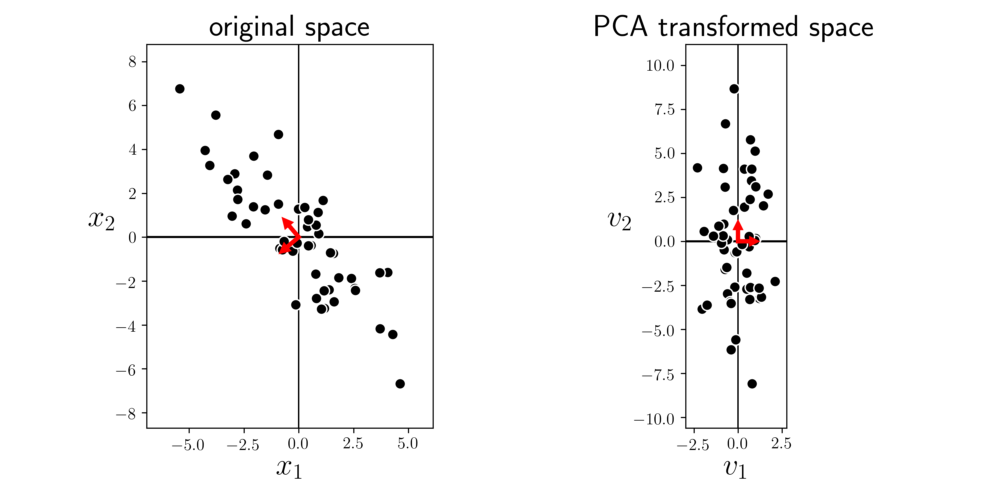

In [98]:
# load in dataset to perform PCA on, and mean-center
X_original = np.loadtxt(datapath + '2d_span_data.csv',delimiter=',')

# mean-center the data
X = center(X_original)

# compute the full PCA transformation of dataset
W,pcs = pca_transform_data(X)

# plot data in original and pca-transformed spaces
unsuplib.PCA_demos.pca_visualizer(X,W,pcs)

#### <span style="color:#a50e3e;">Example 6: </span>  Using Principal Component Analysis to sphere data for supervised learning

Previously we have seen  with linear regression / classification how normalizing a dataset - by subtracting off the mean and dividing by the standard deviation along each of its feature dimensions - helps dramatically improve (or *condition*) the contours of a cost function, allowing gradient and coordinate descent methods to converge much faster than they typically would otherwise.

The spanning set provided by Principal Component Analysis is often used to perform this sort of normalization to supervised learning data as well - but actually goes one step further.  Because the principal components identify the orthogonal directions of greatest variance, and the transformed feature space provided by them is a perfect copy of our data rotated such that these directions align with the coordinate axes, normalizing the transformed feature space along each coordinate axes can better compact-ify our data.  For the same reasons as we have seen with the standard normalization scheme, this can greatly improve the convergence of gradient / coordinate descent.  This type of normalization - which again is used very often for supervised learning problems - is called *sphereing* (or also synonymously called *whitening*).

Since each data point is represented by $\hat{\mathbf{w}}_p = \mathbf{V}_{\,}^T\mathbf{x}_p^{\,}$ in the space spanned by the principal components, we can represent the entire set of transformed data as 

\begin{equation}
\text{(PCA transformed data)}\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\mathbf{W} = \mathbf{V}^T\mathbf{X}^{\,}.
\end{equation}

Now we aim to normalize each column of the transformed data $\mathbf{W}$.  Since these transformed features were built from a mean-centered dataset the columns of $\mathbf{W}$ are mean-centered themselves, so all that remains is to divide off the standard deviation of each column.  

This can be done in the typical way numerically - or to save computation we can conveniently the unnormalized variance of each column of $\mathbf{W}$ has already been computed in the eigen-decomposition of the covariance matrix $\frac{1}{P}\mathbf{X}^{\,}\mathbf{X}^T$: these are precisely the eigenvalues (as mentioned in the derivation above).  In other word, since $d_n$ is the variance along the $n^{th}$ axis defined by the $n^{th}$ eigenvector $\mathbf{v}_n$ the corresponding standard deviation can be computed as its square root $\left(d_n\right)^{^1/_2}$.  So denoting $\mathbf{D}^{-^1/_2}$ the diagonal matrix whose $n^{th}$ entry is $\left(d_n\right)^{^1/_2}$, we can divide off the standard deviation each column of $\mathbf{W}$ by e.g.,
 left-multiplying by as

\begin{equation}
\text{(sphered data)}\,\,\,\,\,\,\,\,\, \mathbf{S}^{\,} = \mathbf{D}^{-^1/_2}\mathbf{W}^{\,} =  \mathbf{D}^{-^1/_2}\mathbf{V}^T\mathbf{X}^{\,}.
\end{equation}

<figure>
  <img src= 'sphereing.png' width="50%"  height="auto" alt=""/>
  <figcaption>   
<strong>Figure 1:</strong> <em> **MAKE IMAGE** to summarize sphereing - should look something like this one  [great image taken from here](https://arxiv.org/pdf/1404.2986.pdf)  Interestingly - author is another person from google research. </em>  </figcaption> 
</figure>

A ``Python`` function for performing sphereing - based off the functionality previously provided - is below. 

In [99]:
def sphere_data(X):
    '''
    A function for producing the full PCA sphereing on an input dataset X.  
    '''
    # compute principal components
    V,D = compute_pcs(X)
    
    # compute transformed data for PC space: V^T X
    W = np.dot(V.T,X)
    D_ = np.array([1/d**(0.5) for d in D])
    D_ = np.diag(D_)
    S = np.dot(D_,W)
    return W,S

With this function defined we can try it out on a sample dataset used in e.g., the previous example.  The next cell runs the sphereing code above, and plots comparisons of the a) the original mean-centered data (left panel), b) the PCA-transformed data (middle panel), and c) sphered data (right panel).  Here sphereing drastically improved the distribution of the original dataset, which (if this were a supervised learning dataset) will drastically improve our ability to quickly tune the parameters of a supervised model via gradient / coordinate descent.

<IPython.core.display.Javascript object>


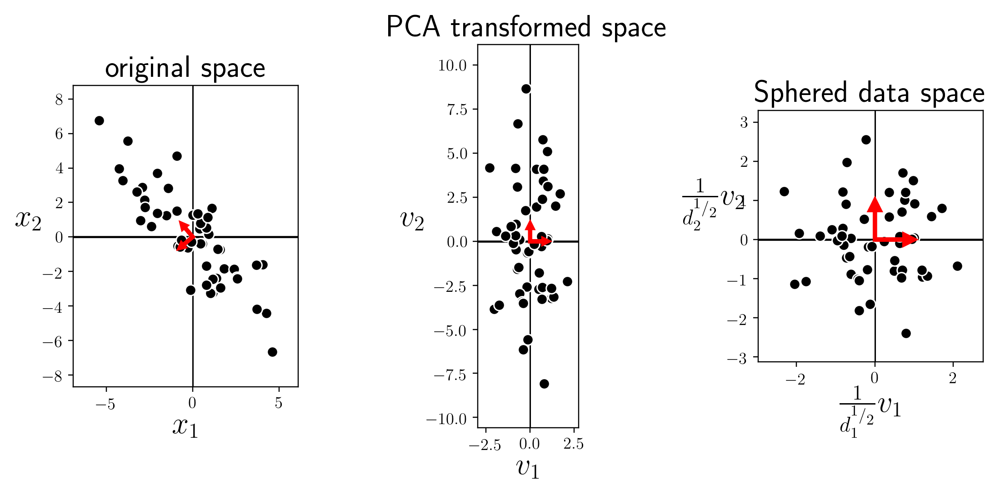

In [101]:
# load in dataset to perform PCA on
X_original = np.loadtxt(datapath + '2d_span_data.csv',delimiter=',')

# mean-center the data
X = center(X_original)

# compute the full PCA transformation of dataset
W,S = sphere_data(X)

# compute principal components
unsuplib.PCA_demos.sphereing_visualizer(X,W,S,pcs)

## 2.3  Imperfectly representing data using a learned spanning set

We can also used PCA to find an ideal lower dimensional *linear* representation of a given set of high dimensional.  This the natural extension of the paradigm we reviewed in the previous Section - where we assumed to be given a set of $K \leq N$ spanning / basis vectors over which we represented a given set of $P$ high dimensional datapoints

\begin{equation}
\sum_{n=1}^K \mathbf{c}_n w_{p,n} \approx \mathbf{x}_p  \,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\,\, p=1...P
\end{equation}

only now we give ourselves more degrees of freedom by *learning* the best basis over which to represent our data.

Precisely the same sort of analysis discussed in Section 2.1 leads us to the Least Squares cost function in equation (27), only now we have only $K$ spanning set vectors in the matrix  $\mathbf{C} = 
\begin{bmatrix}
\vert \,\,\,\,\, \vert \,\,\, \cdots  \, \vert \\
\mathbf{c}_1 \,\,\, \mathbf{c}_2 \,\,\,\,\,\, \mathbf{c}_K \\
\vert \,\,\,\,\, \vert \,\,\, \cdots  \, \vert
\end{bmatrix}$ to learn.  As with the case with the full spanning set, we can use a block-coordinate approach (as shown in equations (28) and 29)) to generally minimize the Least Squares cost function, and recover an appropriate learned basis and corresponding subspace on which to project our dataset.

## 2.4  Imperfect representation using a fixed orthonormal spanning set

Using the same argument as described in Section 2.2 we can learn the PCA orthogonal basis for an ideal $K \leq N$ dimensional linear subspace by simply computing / keeping the first $K$ principal components only.  Equivalently these are the first $K$ eigenvectors of the covariance matrix $\frac{1}{P}\mathbf{X}^{\,}\mathbf{X}^T$.  Denoting the eigen-decomposition of this matrix as $\frac{1}{P}\mathbf{X}^{\,} \mathbf{X}^T = \mathbf{V}^{\,}\mathbf{D}^{\,}\mathbf{V}^T$, this means that we need the first $K$ columns of the matrix $\mathbf{V}$, with $\mathbf{c}_n = \mathbf{v}_n$ for $n=1...K$.

#### <span style="color:#a50e3e;">Example 7: </span>  Dimension reduction with PCA

In this example we illustrate how the orthonormal PCA basis can be used to represent a three-dimensional dataset via its ideal two-dimensional linear subspace, using the first two principal components.  In the next cell we load in the dataset first shown in Example 3, compute the orthonormal PCA spanning set based on the eigenvectors of $\frac{1}{P}\mathbf{X}^{\,}\mathbf{X}^T$, and project the data onto the two-dimensional subspace spanned by the top two eigenvectors.  These top two eigenvectors and the subspace they span are shown in red in the left panel below, with the projected data in the subspace spanned by the top two eigenvectors are shown in the right panel.

<IPython.core.display.Javascript object>


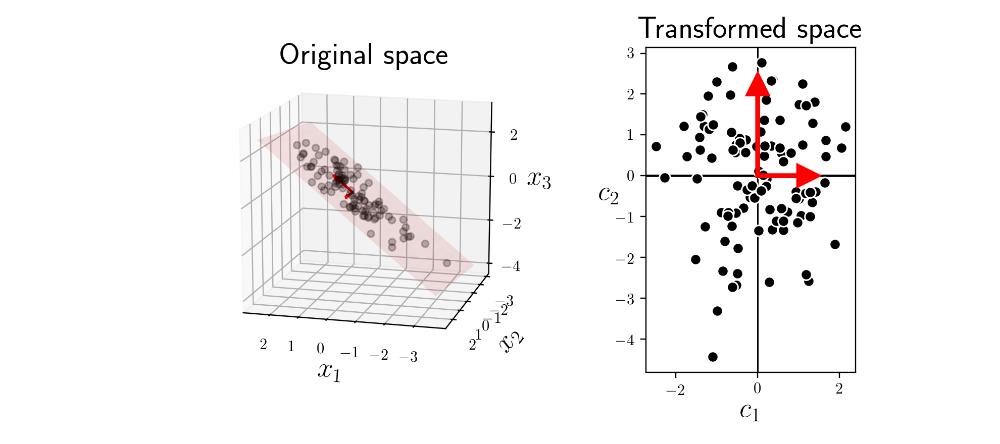

In [84]:
# load in dataset to perform PCA on
X_original = np.loadtxt(datapath + '3d_span_data.csv',delimiter=',')

# mean-center the data
X = center(X_original)

# compute the two-dimensional PCA transformation of dataset
W,pcs = pca_transform_data(X,num_components = 2)

# produce visuals
init = [15,105]
unsuplib.PCA_demos.project_data_from_3d_to_2d(X,W,pcs,init)

#### <span style="color:#a50e3e;">Example 8: </span> A warning about PCA dimension reduction and classification data

While PCA dimension reduction can technically be used for preprocessing data in a predictive modeling scenario - wherein the data is reduced in dimension in hopes of improving accuracy / computation time -  it can cause severe problems in the case of classification. In this Example we illustrate feature space dimension reduction via PCA on a simulated two-class dataset where the two classes are linearly separable. Because the ideal one-dimensional subspace in this instance runs parallel to the longer length of each class, projecting the complete dataset onto it completely destroys the separability. 

Because of this, while it is certainly common place to *sphere* classification data using PCA - as detailed in Example 6 - one needs to be extremely careful using PCA as a dimension reduction tool with classification.  

<figure>
  <img src= '../../mlrefined_images/unsupervised_images/Fig_9_7.png' width="55%" height="auto" alt=""/>
  <figcaption>   
<strong>Figure 3:</strong> <em> (left) A toy classification dataset consisting of two linearly separable classes. The ideal subspace produced via PCA is shown in black. (right) Projecting the data onto this subspace (in other words reducing the feature space dimension via PCA) destroys completely the original separability of the data.  </em>  </figcaption> 
</figure>